---
title: "Generate Synthetic Data Using Real Data with TabPFN"
description: "Sample new rows that mirror the statistics of an existing table"
icon: "plus"
cookbookTags:
  - extensions
authors:
  - name: Kürşat Kaya
    linkedin: https://www.linkedin.com/in/kursatkaya
    github: https://github.com/kursatfelsen
---

*Given a real table, sample new rows that follow the same statistical patterns.*

Tabular data is everywhere: spreadsheets, customer records, financial logs, medical registries. Yet getting a usable table for a demo or prototype is often blocked by privacy concerns and regulations. Synthetic data works around that: artificial rows that preserve the statistical patterns of the real table without exposing individual records.

Common tools include scikit-learn's [`make_*`](https://scikit-learn.org/stable/datasets/sample_generators.html) functions, [`Faker`](https://faker.readthedocs.io/) for rule-based generation, and GAN-based methods like [CTGAN](https://github.com/sdv-dev/CTGAN) or [TabGAN](https://github.com/Diyago/Tabular-data-generation). These are powerful but often complex to set up. TabPFN is a foundation model specialised for tabular data, and its unsupervised tools let us generate a look-alike table without training a GAN or building a simulation.

In this notebook we take an existing dataset (scikit-learn's Breast Cancer table) as the source, fit TabPFN's unsupervised model on it, and sample new rows that share its column distributions and correlations. The result is a standalone synthetic table that can stand in for the real one (for a demo, a test fixture, or to extend the training set) which we then compare against the original with a few fidelity plots.

You can use this approach to:

- Realistic demo data to share with customers or collaborators without exposing real records.
- QA and pipeline tests with plausible rows before going live on real data.
- Fast prototyping when access to the real dataset is restricted.

## Setup

*Installing TabPFN, its extensions, and seaborn.*

The unsupervised synthetic-data helpers live in `tabpfn_extensions`; seaborn and scikit-learn draw the fidelity plots at the end.

In [ ]:
!pip install -U tabpfn tabpfn-client tabpfn_extensions scikit-learn "seaborn>=0.13"

## Imports and Data

*Loading the Breast Cancer dataset as our safe, realistic table.*

We use scikit-learn's Breast Cancer dataset, a classic, non-sensitive table that stands in for whatever proprietary data you would like to synthesise. We keep a train/test split so the synthetic table can later be compared against real data the model never saw.

In [1]:
import pandas as pd
import torch
from google.colab import userdata
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

from tabpfn_extensions import TabPFNClassifier, TabPFNRegressor
from tabpfn_extensions.unsupervised import TabPFNUnsupervisedModel
from tabpfn_extensions.unsupervised.experiments import GenerateSyntheticDataExperiment

data = load_breast_cancer()
X, y = data["data"], data["target"]
feature_names = data["feature_names"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42
)

In [2]:
from tabpfn_client import set_access_token
set_access_token(userdata.get('TABPFN_TOKEN'))

## Building the Unsupervised Model

*Wrapping a classifier and a regressor into `TabPFNUnsupervisedModel`.*

The synthetic-data experiment expects a `TabPFNUnsupervisedModel`, which pairs a `TabPFNClassifier` (for discrete columns) with a `TabPFNRegressor` (for continuous columns). Together they let TabPFN model each column conditional on the others and sample new rows from that joint distribution.

In [3]:
model_unsupervised = TabPFNUnsupervisedModel(
    tabpfn_clf=TabPFNClassifier(n_estimators=3),
    tabpfn_reg=TabPFNRegressor(n_estimators=3),
)

## Generating the Synthetic Table

*Running the experiment to produce look-alike rows.*

`GenerateSyntheticDataExperiment` handles the sampling loop. `temp` controls diversity: higher values give more varied rows, lower values stay closer to the training data. `n_samples` sets how many rows we want out. Here we ask for twice as many rows as the training split, over all 30 features. Inputs come in as tensors, and the resulting synthetic table is written to `synthetic.csv` for the evaluation step.

In [4]:
X_tensor = torch.tensor(X_train, dtype=torch.float32)
y_tensor = torch.tensor(y_train)

experiment = GenerateSyntheticDataExperiment(task_type="unsupervised")

experiment.run(
    tabpfn=model_unsupervised,
    X=X_tensor,
    y=y_tensor,
    attribute_names=feature_names,
    temp=1.0,  # temperature controls sample diversity
    n_samples=X_train.shape[0] * 2,  # 2x more rows than the original train split
    indices=list(range(X_tensor.shape[1])),
)

synthetic = experiment.data_synthetic.drop(columns=["real_or_synthetic"], errors="ignore")
synthetic.to_csv("synthetic.csv", index=False)
synthetic.head()

100%|██████████| 30/30 [01:52<00:00,  3.76s/it]


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,19.903595,26.502161,128.942184,1235.166504,0.096553,0.078243,0.134940,0.081050,0.177620,0.054020,...,23.023104,32.658436,148.710709,1629.686646,0.111088,0.141686,0.333584,0.142335,0.265637,0.068462
1,12.146170,14.239326,77.204369,451.148529,0.078844,0.052200,0.017760,0.014428,0.160011,0.061478,...,12.924338,19.307337,83.267685,508.845581,0.099757,0.083999,0.036157,0.017527,0.204648,0.067547
2,13.693434,23.262606,90.649910,563.356445,0.112994,0.181681,0.175739,0.075272,0.183574,0.075747,...,15.432154,32.553181,101.147064,684.368591,0.176672,0.432907,0.610035,0.183725,0.306758,0.121596
3,18.486366,26.499252,120.000671,1058.482666,0.082668,0.107710,0.105232,0.055753,0.159127,0.058383,...,21.179552,30.579182,138.042175,1388.463867,0.100403,0.182912,0.261013,0.091476,0.227975,0.067705
4,12.801287,25.754616,82.406975,500.628143,0.113541,0.082443,0.017421,0.023415,0.213717,0.064066,...,13.893790,29.936686,89.816132,597.608948,0.121169,0.139316,0.068041,0.055712,0.277136,0.072171


## Comparing Real vs. Synthetic

*Checking fidelity on three levels.*

A synthetic table is only useful if it behaves like the real thing. We compare the two side by side on three levels: the distribution of each column, the correlation structure between columns, and the low-dimensional geometry of the rows. The plots use pandas, seaborn, and scikit-learn only, so nothing extra needs to be installed.

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

real = pd.DataFrame(data.data, columns=data.feature_names)
fake = pd.read_csv("synthetic.csv")[real.columns]

print(f"real rows: {len(real)} | synthetic rows: {len(fake)} | columns: {real.shape[1]}")

real rows: 569 | synthetic rows: 762 | columns: 30


### Distributions

*Do the synthetic columns look like the real ones?*

The per-feature density curves show how closely each synthetic column tracks the real distribution. A close overlap means the marginals have been preserved.

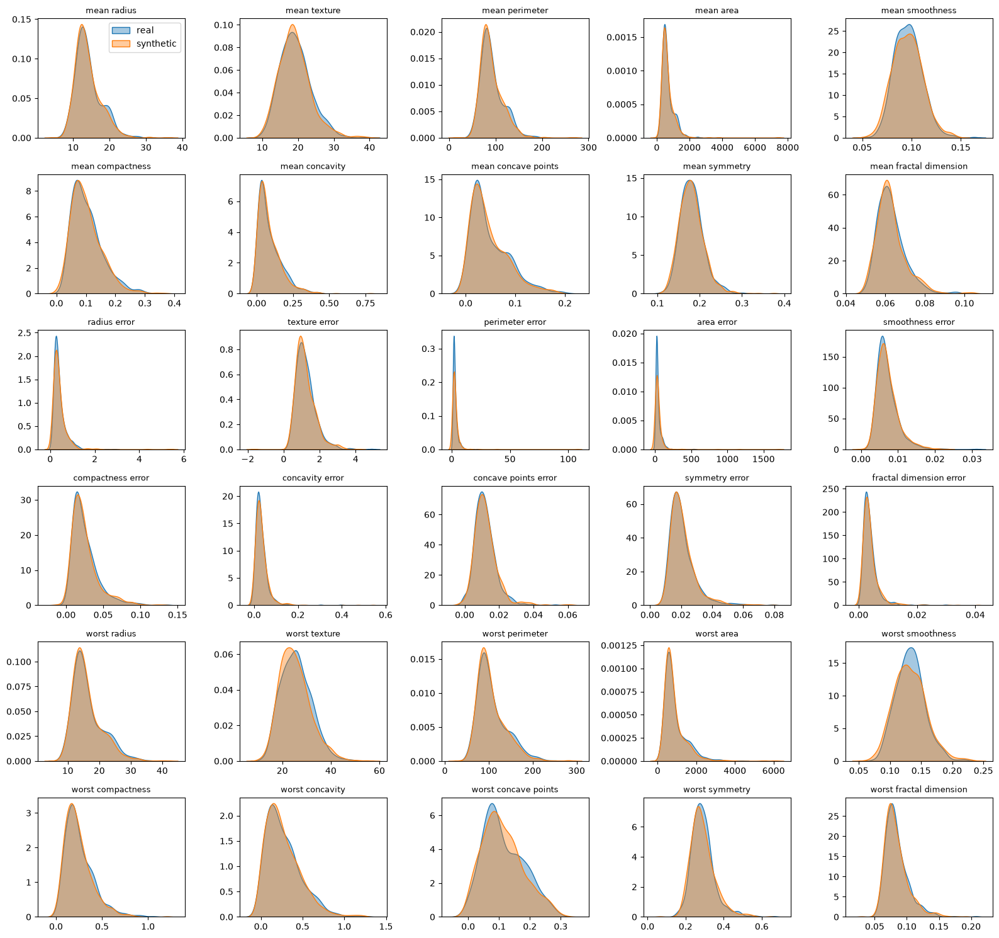

In [6]:
fig, axes = plt.subplots(6, 5, figsize=(16, 15))
for ax, column in zip(axes.flat, real.columns):
    sns.kdeplot(real[column], ax=ax, label="real", fill=True, alpha=0.4)
    sns.kdeplot(fake[column], ax=ax, label="synthetic", fill=True, alpha=0.4)
    ax.set_title(column, fontsize=9)
    ax.set_xlabel("")
    ax.set_ylabel("")
axes.flat[0].legend()
fig.tight_layout()
plt.show()

### Correlations

*Are the relationships between features still there?*

TabPFN samples each column conditional on the others, so we care about more than just marginals. The correlation-difference heatmap highlights where the synthetic table's feature-to-feature relationships depart from the real table. Small values mean the joint structure held up.

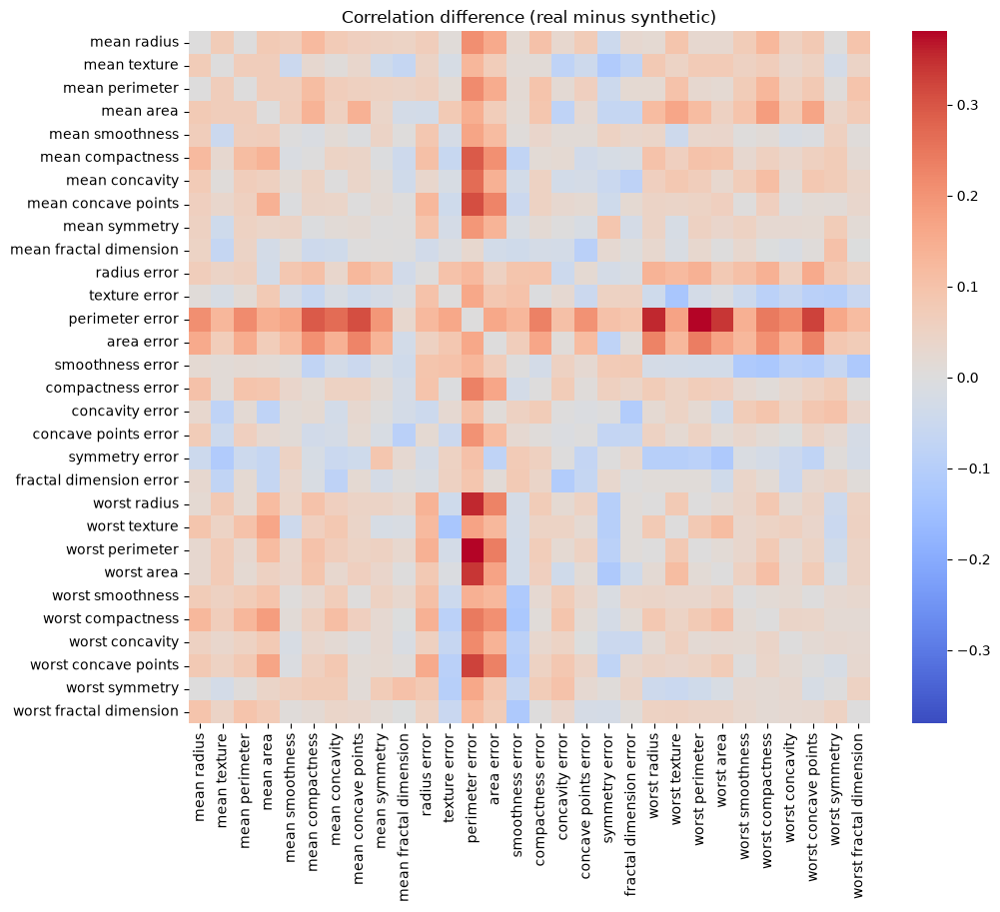

mean absolute correlation difference: 0.063


In [7]:
corr_diff = real.corr() - fake.corr()
limit = corr_diff.abs().to_numpy().max()

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr_diff, cmap="coolwarm", center=0, vmin=-limit, vmax=limit, ax=ax)
ax.set_title("Correlation difference (real minus synthetic)")
plt.show()

print(f"mean absolute correlation difference: {corr_diff.abs().to_numpy().mean():.3f}")

### PCA Projection

*Do the two tables share the same low-dimensional geometry?*

We standardize the features and fit a two-component PCA on the real table, then project both tables onto it. Overlapping clouds mean the synthetic rows live in the same subspace as the real ones.

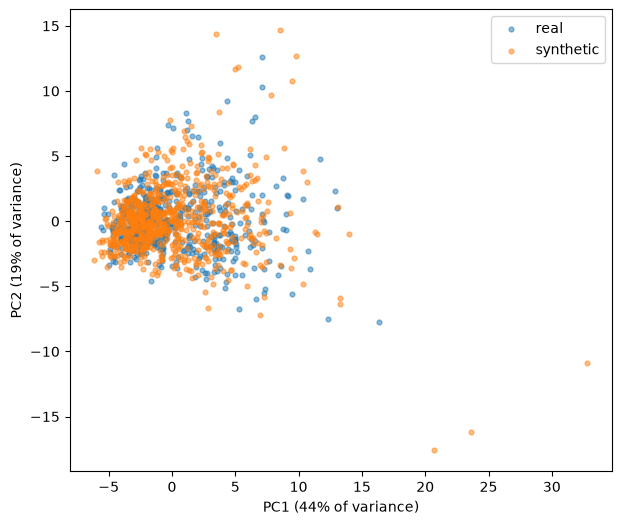

In [8]:
scaler = StandardScaler().fit(real)
pca = PCA(n_components=2).fit(scaler.transform(real))
real_2d = pca.transform(scaler.transform(real))
fake_2d = pca.transform(scaler.transform(fake))

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(real_2d[:, 0], real_2d[:, 1], s=12, alpha=0.5, label="real")
ax.scatter(fake_2d[:, 0], fake_2d[:, 1], s=12, alpha=0.5, label="synthetic")
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.0%} of variance)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.0%} of variance)")
ax.legend()
plt.show()